# Clasificación de Imágenes: ¿IA o Real?

Este notebook aborda el problema de distinguir entre imágenes generadas por inteligencia artificial
y fotografías o arte real, utilizando técnicas de deep learning y el dataset AI-Generated-vs-Real-Images-Datasets.

**Estructura del notebook:**
1. Importar librerías
2. Cargar dataset
3. EDA — Exploración y visualización
4. Preprocesamiento — Filtrado, augmentation y DataLoaders
5. Modelos simples — SimpleCNN y LeNet
6. Transfer Learning — VGG16 y ResNet18 (backbone congelado)
7. Fine-Tuning — Descongelar últimas capas
8. Evaluación final y comparación de modelos

---

## 1. Importar librerías necesarias

In [1]:
# Importar librerías necesarias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from datasets import load_dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
import torchvision
import torchvision.transforms as transforms
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
import random
import os

# Configuración para reproducibilidad
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed(42)

# Comprobar si hay GPU disponible
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando dispositivo: {device}")

C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Usando dispositivo: cuda


## 2. Descargar y cargar el dataset desde HuggingFace

Utilizaremos la librería `datasets` de HuggingFace para descargar el dataset `Hemg/AI-Generated-vs-Real-Images-Datasets`. Contiene imágenes etiquetadas como `0` (generada por IA) y `1` (real).

In [2]:
# Descargar y cargar el dataset
dataset = load_dataset("Hemg/AI-Generated-vs-Real-Images-Datasets")

# Mostrar información básica del dataset
print(dataset)
print("Ejemplo de registro:")
print(dataset['train'][0])

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 152710
    })
})
Ejemplo de registro:
{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=880x440 at 0x286D2A5A7B0>, 'label': 0}


## 3. EDA — Exploración y visualización inicial

Antes de entrenar cualquier modelo es importante entender el dataset:
- Distribución de clases (¿está balanceado?)
- Ejemplos visuales de cada clase
- Diferencias visuales entre imágenes IA y reales

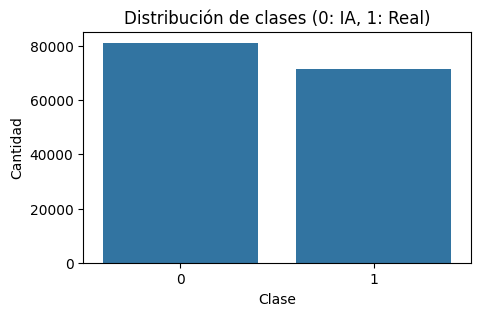

In [3]:
# Visualizar la distribución de etiquetas
y_labels = [item['label'] for item in dataset['train']]
plt.figure(figsize=(5,3))
sns.countplot(x=y_labels)
plt.title('Distribución de clases (0: IA, 1: Real)')
plt.xlabel('Clase')
plt.ylabel('Cantidad')
plt.show()

# Mostrar ejemplos de imágenes de ambas clases
def show_examples(ds, n=4):
    fig, axes = plt.subplots(1, n, figsize=(15,4))
    count = 0
    for i, item in enumerate(ds):
        if count >= n:
            break
        img = item['image']
        label = item['label']
        axes[count].imshow(img)
        axes[count].set_title(f"Label: {label}")
        axes[count].axis('off')
        count += 1
    plt.show()


Ejemplos de imágenes generadas por IA (label=0):


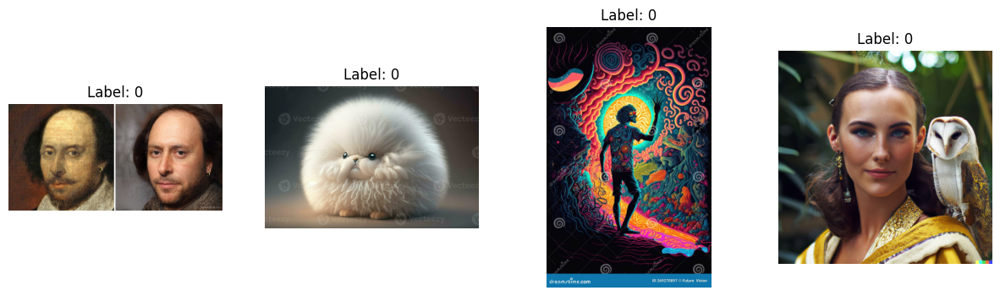

In [4]:
print("Ejemplos de imágenes generadas por IA (label=0):")
show_examples([item for item in dataset['train'] if item['label']==0][:4])

Ejemplos de imágenes reales (label=1):


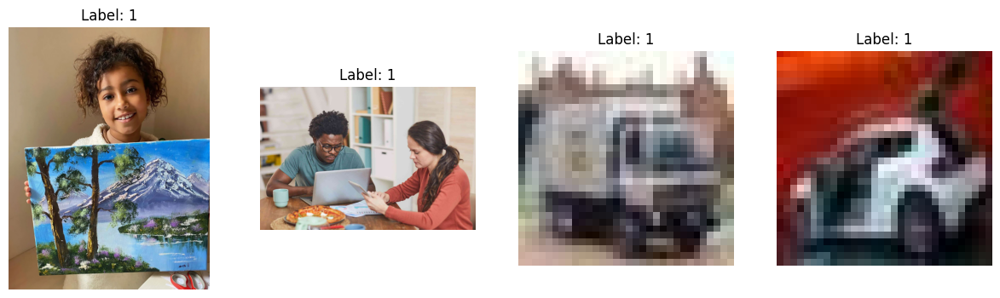

In [5]:
print("Ejemplos de imágenes reales (label=1):")
show_examples([item for item in dataset['train'] if item['label']==1][:4])

## 4. Preprocesamiento

El preprocesamiento tiene tres etapas:
1. **Filtrado de calidad** — eliminar imágenes corruptas, vacías o de baja calidad
2. **Data Augmentation** — transformaciones para hacer el modelo más robusto
3. **División y DataLoaders** — train/val/test splits y carga eficiente

---

### 4.1 Filtrado de imágenes corruptas

Filtramos imágenes que no se pueden cargar, o que son completamente negras/blancas (sin variación de píxeles).
Esto se hace antes del split para no contaminar ningún conjunto.

In [6]:
from PIL import Image, UnidentifiedImageError
import numpy as np

def safe_load_image(example):
    """
    Verifica que la imagen sea cargable, convertible a RGB
    y que tenga variación de píxeles suficiente (no toda negra/blanca).
    Compatible con datasets.filter() — recibe dict, retorna bool.
    """
    try:
        img = example['image']
        img.load()  # fuerza decodificación real

        # Convertir a RGB y verificar variación de color
        arr = np.array(img.convert("RGB"))
        if arr.std() < 1.0:   # imagen sin variación → descartada
            return False

        return True
    except Exception:
        return False

# Aplicar filtro y reportar por clase
total_original = len(dataset['train'])
full_data = dataset['train'].filter(safe_load_image)
descartadas = total_original - len(full_data)

# Contar descartadas por clase comparando labels
labels_original = [ex['label'] for ex in dataset['train']]
labels_validas  = set(range(len(full_data)))   # índices supervivientes no disponibles directamente

# Reporte simplificado (HuggingFace no expone índices descartados fácilmente)
print(f"Total original      : {total_original}")
print(f"Imágenes válidas    : {len(full_data)}")
print(f"Imágenes descartadas: {descartadas}")

# Distribución de clases tras filtrado
from collections import Counter
class_counts = Counter(full_data['label'])
print(f"  · Clase 0 (IA)   válidas: {class_counts[0]}")
print(f"  · Clase 1 (Real) válidas: {class_counts[1]}")


Total original      : 152710
Imágenes válidas    : 152710
Imágenes descartadas: 0
  · Clase 0 (IA)   válidas: 81174
  · Clase 1 (Real) válidas: 71536


### 4.2 Filtrado por resolución mínima y borrosidad (Laplacian)

Descartamos imágenes menores a 128×128 px y/o con varianza del Laplaciano < 50.

**Nota para Lucas (TODO):**
- Verificar hipótesis: ¿las imágenes de baja resolución afectan la precisión del modelo?
  - Graficar BlurVar vs predicciones correctas/incorrectas usando SimpleCNN
  - Si baja resolución → peor accuracy: considerar subir `min_size` a 160-192 px
  - Documentar como limitación o fortaleza según el resultado

Antes del filtrado         : 152710
  · Descartadas por tamaño : 109815
  · Descartadas por borrosidad: 6525
Después de filtrar         : 36370 imágenes
  · Clase 0 (IA)   válidas: 19189
  · Clase 1 (Real) válidas: 17181


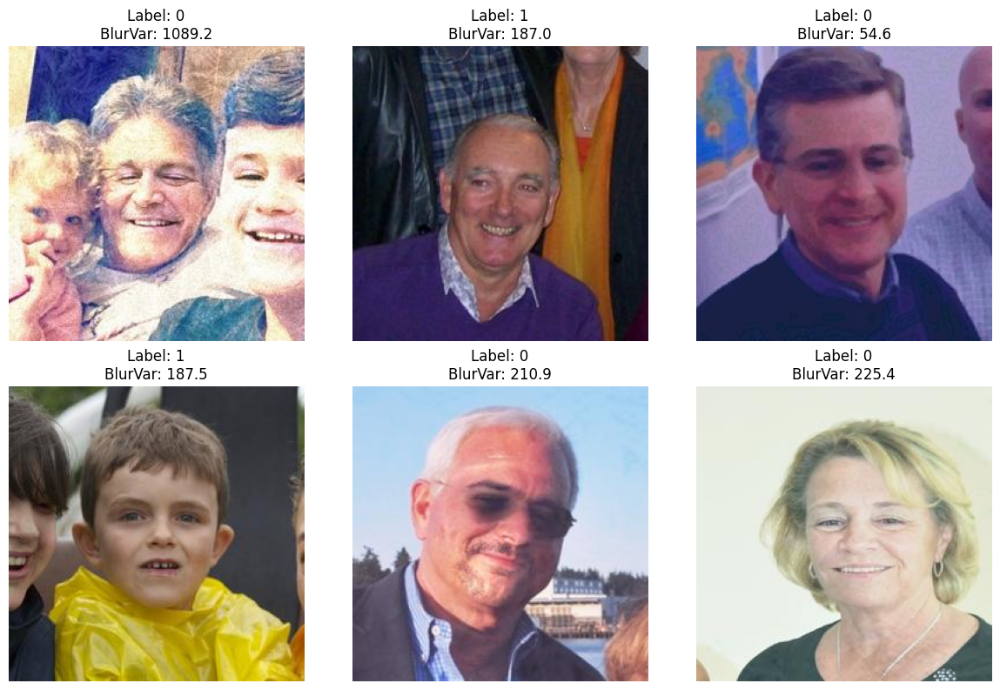

In [8]:
import cv2
import numpy as np
from collections import Counter
import random
import matplotlib.pyplot as plt

def is_sharp_and_large(example, min_size=128, blur_threshold=50):
    """
    Filtro de dos niveles:
      1. Resolución mínima: descarta si ancho o alto < min_size px.
      2. Borrosidad (Laplacian variance): descarta si la varianza del
         Laplaciano en escala de grises < blur_threshold.
    Compatible con datasets.filter() — recibe dict, retorna bool.
    """
    try:
        img = example['image']
        w, h = img.size

        if w < min_size or h < min_size:
            return False  # demasiado pequeña

        gray = np.array(img.convert("L"))
        laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
        return laplacian_var >= blur_threshold

    except Exception:
        return False

# ── Conteo separado por criterio ──────────────────────────────────────────────
def count_fails_resolution(example, min_size=128):
    try:
        img = example['image']
        w, h = img.size
        return w < min_size or h < min_size
    except Exception:
        return True

def count_fails_blur(example, blur_threshold=50):
    try:
        img = example['image']
        gray = np.array(img.convert("L"))
        lv = cv2.Laplacian(gray, cv2.CV_64F).var()
        return lv < blur_threshold
    except Exception:
        return True

# Filtrar por resolución primero
data_res = full_data.filter(lambda ex: not count_fails_resolution(ex))
descartadas_res = len(full_data) - len(data_res)

# Luego filtrar por borrosidad (sobre las que pasaron resolución)
data_blur = data_res.filter(lambda ex: not count_fails_blur(ex))
descartadas_blur = len(data_res) - len(data_blur)

# Dataset final limpio
filtered_data = data_blur

print(f"Antes del filtrado         : {len(full_data)}")
print(f"  · Descartadas por tamaño : {descartadas_res}")
print(f"  · Descartadas por borrosidad: {descartadas_blur}")
print(f"Después de filtrar         : {len(filtered_data)} imágenes")

# Distribución de clases final
class_counts_filtered = Counter(filtered_data['label'])
print(f"  · Clase 0 (IA)   válidas: {class_counts_filtered[0]}")
print(f"  · Clase 1 (Real) válidas: {class_counts_filtered[1]}")

# ── Mostrar imágenes aleatorias ─────────────────────────────────────

num_samples = 6

samples = random.sample(range(len(filtered_data)), num_samples)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

axes = axes.flatten()

for ax, idx in zip(axes, samples):

    example = filtered_data[idx]

    img = example['image']

    # Blur metric
    gray = np.array(img.convert("L"))
    lv = cv2.Laplacian(gray, cv2.CV_64F).var()

    ax.imshow(img)
    ax.set_title(
        f"Label: {example['label']}\nBlurVar: {lv:.1f}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

### Hipótesis: impacto de la resolución y borrosidad en la precisión del modelo
Para evaluar si las imágenes de baja resolución o alta borrosidad perjudican la capacidad de clasificación, se propone el siguiente análisis post-entrenamiento con SimpleCNN:

* Calcular la varianza del Laplaciano (BlurVar) de cada imagen en el conjunto de test.
* Cruzar ese valor con el resultado de la predicción (correcto / incorrecto) del modelo SimpleCNN.
* Graficar la distribución de BlurVar separada por predicciones correctas e incorrectas, y calcular la correlación entre ambas variables.

Si el análisis muestra que las imágenes con menor BlurVar o menor resolución concentran una proporción significativamente mayor de errores, el umbral min_size debería elevarse de 128 px a un rango de 160–192 px en futuras iteraciones del pipeline. En ese caso, este resultado se documentaría como una limitación del preprocesamiento actual, ya que el modelo es sensible a la calidad visual de la entrada. Por el contrario, si la distribución de errores es uniforme respecto a BlurVar, el filtro actual sería suficiente y se documentaría como una fortaleza del pipeline, dado que el modelo generaliza bien independientemente del nivel de nitidez de las imágenes.

In [ ]:
# Análisis BlurVar vs Accuracy movido a Sección 8.4 (requiere model_simple ya entrenado)

### 4.3 Data Augmentation avanzado

Usamos un conjunto de transformaciones agresivas en entrenamiento para obligar al modelo a aprender
features robustas e invariantes a pequeñas perturbaciones.

El pipeline de validación/test **no** aplica augmentation — solo resize y normalización — para medir
el rendimiento real del modelo.

In [9]:
from torchvision import transforms

imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

# ── Train transform avanzado ──────────────────────────────────────────────────
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(
        brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1
    ),
    transforms.RandomGrayscale(p=0.1),           # fuerza al modelo a no depender solo del color
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),  # simula imágenes ligeramente borrosas
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3), # deformaciones de perspectiva
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.15)),       # elimina parches aleatorios 
])

# Val/test transform sin augmentation (igual que antes)
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std)
])

print("train_transform avanzado definido correctamente.")
print(f"Pasos en train_transform: {len(train_transform.transforms)}")


train_transform avanzado definido correctamente.
Pasos en train_transform: 11


### 4.4 División del dataset y DataLoaders

Dividimos el dataset en **80% train / 10% val / 10% test** con seed fijo para reproducibilidad.

El `CustomImageDataset` maneja de forma robusta los distintos formatos de imagen que puede devolver
HuggingFace (bytes en memoria o path en disco), y recupera automáticamente si una imagen falla.

In [16]:
from PIL import Image, UnidentifiedImageError
from datasets import Image as HFImage
from io import BytesIO
import numpy as np
from torch.utils.data import Dataset as TorchDataset, DataLoader

# Aplicar safe_load_image definida en 4.1 y evitar decodificación automática de HuggingFace
full_data = dataset['train'].filter(safe_load_image)
full_data = full_data.cast_column('image', HFImage(decode=False))

print(f"Dataset limpio: {len(full_data)}")

splits = full_data.train_test_split(test_size=0.2, seed=42)

train_val = splits['train']
test_data = splits['test']

val_split = train_val.train_test_split(test_size=0.125, seed=42)

train_data = val_split['train']
val_data = val_split['test']

print(f"Train: {len(train_data)}")
print(f"Val: {len(val_data)}")
print(f"Test: {len(test_data)}")

class CustomImageDataset(TorchDataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        for _ in range(len(self.dataset)):
            example = self.dataset[idx]
            try:
                img_data = example['image']
                if img_data is None:
                    raise ValueError('Imagen vacia')

                if isinstance(img_data, dict):
                    if img_data.get('bytes') is not None:
                        image = Image.open(BytesIO(img_data['bytes']))
                    elif img_data.get('path') is not None:
                        image = Image.open(img_data['path'])
                    else:
                        raise ValueError('Formato de imagen desconocido')
                else:
                    image = img_data

                image = image.convert('RGB')  # Normalizar a 3 canales — RGBA y P también quedan en RGB




                if self.transform:
                    image = self.transform(image)

                label = example['label']
                return image, label
            except Exception:
                idx = (idx + 1) % len(self.dataset)

        raise RuntimeError('No se pudo cargar ninguna imagen valida en el dataset.')

batch_size = 64
num_workers = 0 # paralelismo en carga de datos (0 = sin multiprocessing, >0 = número de procesos)
pin_memory = device.type == 'cuda'

train_dataset = CustomImageDataset(train_data, transform=train_transform)
val_dataset = CustomImageDataset(val_data, transform=val_test_transform)
test_dataset = CustomImageDataset(test_data, transform=val_test_transform)

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=pin_memory
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=pin_memory
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=pin_memory
)

print(f'DataLoaders listos sin errores (num_workers={num_workers})')

Dataset limpio: 152710
Train: 106897
Val: 15271
Test: 30542
DataLoaders listos sin errores (num_workers=0)


---
## 5. Modelos Simples — Baseline

Antes de usar transfer learning, entrenamos arquitecturas simples hechas a mano.
Esto sirve como **baseline** para medir cuánto aporta el preentrenamiento en ImageNet.

Arquitecturas:
- **SimpleCNN** — red convolucional moderna con 3 bloques Conv→ReLU→MaxPool
- **LeNet** — arquitectura clásica de los 90s, adaptada para 224×224 y clasificación binaria

---

### 5.1 SimpleCNN — Definición

La red se divide en dos partes:
- **`features`**: extrae características visuales (bordes, texturas, formas) mediante capas convolucionales
- **`classifier`**: recibe esas características aplanadas y decide la clase (IA=0 o Real=1)

El `Dropout(0.5)` en el classifier reduce el overfitting desactivando neuronas aleatoriamente durante entrenamiento.
La salida `Sigmoid` convierte el valor a una probabilidad entre 0 y 1.

In [17]:
from torchinfo import summary

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        # features: detecta patrones visuales en la imagen
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),   # 3 canales RGB → 32 mapas de características
            nn.ReLU(),
            nn.MaxPool2d(2),                               # 224x224 → 112x112
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),                               # 112x112 → 56x56
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)                                # 56x56 → 28x28
        )
        # classifier: razona sobre los patrones y decide la clase
        self.classifier = nn.Sequential(
            nn.Flatten(),                                  # [batch, 128, 28, 28] → [batch, 100352]
            nn.Linear(128 * 28 * 28, 128),
            nn.ReLU(),
            nn.Dropout(0.5),                               # regularización: evita overfitting
            nn.Linear(128, 1),
            nn.Sigmoid()                                   # salida: probabilidad entre 0 y 1
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x.squeeze()

# Mostrar arquitectura y número de parámetros
simple_cnn_summary = SimpleCNN()
summary(simple_cnn_summary, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
SimpleCNN                                --                        --
├─Sequential: 1-1                        [1, 128, 28, 28]          --
│    └─Conv2d: 2-1                       [1, 32, 224, 224]         896
│    └─ReLU: 2-2                         [1, 32, 224, 224]         --
│    └─MaxPool2d: 2-3                    [1, 32, 112, 112]         --
│    └─Conv2d: 2-4                       [1, 64, 112, 112]         18,496
│    └─ReLU: 2-5                         [1, 64, 112, 112]         --
│    └─MaxPool2d: 2-6                    [1, 64, 56, 56]           --
│    └─Conv2d: 2-7                       [1, 128, 56, 56]          73,856
│    └─ReLU: 2-8                         [1, 128, 56, 56]          --
│    └─MaxPool2d: 2-9                    [1, 128, 28, 28]          --
├─Sequential: 1-2                        [1, 1]                    --
│    └─Flatten: 2-10                     [1, 100352]               --
│    └

### 5.2 LeNet — Definición

LeNet es la arquitectura CNN original diseñada por LeCun en 1998.
La adaptamos aquí para:
- Entrada **224×224** en lugar de 32×32
- Clasificación **binaria** (IA vs Real) en lugar de 10 clases
- Agregar `Sigmoid` para obtener probabilidad

Comparar LeNet con SimpleCNN muestra qué tan lejos han llegado las arquitecturas en 25 años.

In [18]:
import torch.nn.functional as F

class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        # Bloque convolucional — igual al original pero con 3 canales de entrada (RGB)
        self.conv1 = nn.Conv2d(3, 6, 5)    # 224x224 → 220x220
        self.pool  = nn.MaxPool2d(2)        # 220x220 → 110x110
        self.conv2 = nn.Conv2d(6, 16, 5)   # 110x110 → 106x106 → pool → 53x53
        self.conv3 = nn.Conv2d(16, 120, 5) # 53x53 → 49x49

        # Clasificador — adaptado a 120*49*49 entradas y 1 salida binaria
        self.flat  = nn.Flatten()
        self.fc1   = nn.Linear(120 * 49 * 49, 64)
        self.fc2   = nn.Linear(64, 1)       # 1 salida para clasificación binaria

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = self.flat(x)
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))     # Sigmoid para probabilidad binaria
        return x.squeeze()

# Mostrar arquitectura y número de parámetros
lenet_summary = LeNet()
summary(lenet_summary, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
LeNet                                    --                        --
├─Conv2d: 1-1                            [1, 6, 220, 220]          456
├─MaxPool2d: 1-2                         [1, 6, 110, 110]          --
├─Conv2d: 1-3                            [1, 16, 106, 106]         2,416
├─MaxPool2d: 1-4                         [1, 16, 53, 53]           --
├─Conv2d: 1-5                            [1, 120, 49, 49]          48,120
├─Flatten: 1-6                           [1, 288120]               --
├─Linear: 1-7                            [1, 64]                   18,439,744
├─Linear: 1-8                            [1, 1]                    65
Total params: 18,490,801
Trainable params: 18,490,801
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 183.19
Input size (MB): 0.60
Forward/backward pass size (MB): 6.07
Params size (MB): 73.96
Estimated Total Size (MB): 80.63

### 5.3 Funciones de entrenamiento y evaluación

Definimos funciones reutilizables para entrenar y evaluar **cualquier modelo** del notebook.

In [28]:
def train_one_epoch(model, loader, criterion, optimizer, device):
    """Entrena el modelo por una época y retorna la pérdida promedio y accuracy."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in loader:
        images = images.to(device)
        labels = labels.float().to(device)
        optimizer.zero_grad()
        outputs = model(images).squeeze()  # [batch,1] → [batch] para BCELoss
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        preds = (outputs.detach() > 0.5).float()
        correct += (preds == labels).sum().item()
        total += labels.size(0)
    return running_loss / len(loader.dataset), correct / total

def evaluate(model, loader, criterion, device):
    """Evalúa el modelo en un loader y retorna pérdida y accuracy."""
    model.eval()
    running_loss = 0.0
    preds, targets = [], []
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.float().to(device)
            outputs = model(images).squeeze()  # [batch,1] → [batch]
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            preds.extend((outputs.cpu().numpy() > 0.5).astype(int))
            targets.extend(labels.cpu().numpy().astype(int))
    return running_loss / len(loader.dataset), accuracy_score(targets, preds)

def evaluate_model(model, loader, device):
    """Retorna predicciones y etiquetas reales para métricas detalladas."""
    model.eval()
    preds, targets = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.float().to(device)
            outputs = model(images).squeeze()  # [batch,1] → [batch]
            preds.extend((outputs.cpu().numpy() > 0.5).astype(int))
            targets.extend(labels.cpu().numpy().astype(int))
    return np.array(preds), np.array(targets)

def evaluate_and_report(model, loader, model_name, device):
    """Imprime reporte completo y matriz de confusión para un modelo."""
    preds, targets = evaluate_model(model, loader, device)
    print(f"\nReporte para {model_name}:")
    print(classification_report(targets, preds, target_names=["IA", "Real"]))
    cm = confusion_matrix(targets, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=["IA", "Real"], yticklabels=["IA", "Real"])
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.title(f'Matriz de confusión — {model_name}')
    plt.show()

def plot_training_curves(train_losses, val_losses, val_accuracies, model_name):
    """Grafica curvas de pérdida y accuracy durante el entrenamiento."""
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.legend()
    plt.title(f'Curva de pérdida ({model_name})')
    plt.subplot(1, 2, 2)
    plt.plot(val_accuracies, label='Val Accuracy')
    plt.legend()
    plt.title(f'Precisión en validación ({model_name})')
    plt.show()

### 5.4 Entrenamiento SimpleCNN

C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[SimpleCNN] Epoch 1/5 - Train Loss: 0.6026 - Val Loss: 0.5119 - Val Acc: 0.7163


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[SimpleCNN] Epoch 2/5 - Train Loss: 0.5040 - Val Loss: 0.5243 - Val Acc: 0.7438


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[SimpleCNN] Epoch 3/5 - Train Loss: 0.4454 - Val Loss: 0.4274 - Val Acc: 0.8112


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[SimpleCNN] Epoch 4/5 - Train Loss: 0.4094 - Val Loss: 0.4287 - Val Acc: 0.8015


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[SimpleCNN] Epoch 5/5 - Train Loss: 0.3874 - Val Loss: 0.3845 - Val Acc: 0.8275


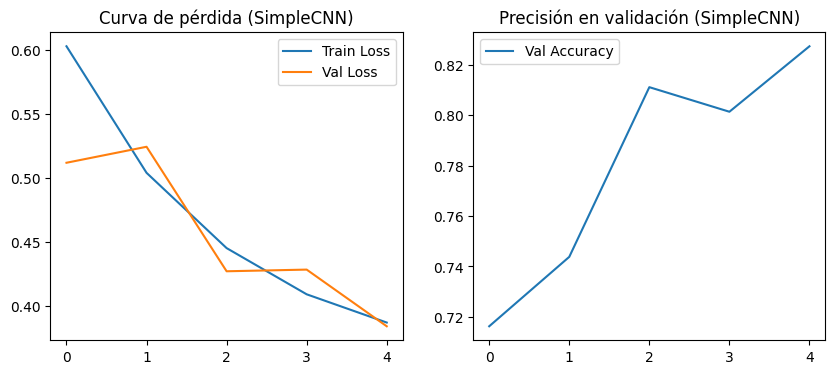

In [20]:
num_epochs = 5
model_simple = SimpleCNN().to(device)
criterion = nn.BCELoss()  # Binary Cross Entropy — versión binaria de cross entropy, espera salida con Sigmoid
optimizer = optim.Adam(model_simple.parameters(), lr=1e-3)

train_losses_simple, val_losses_simple, val_accs_simple = [], [], []

for epoch in range(num_epochs):
    train_loss = train_one_epoch(model_simple, train_loader, criterion, optimizer, device)
    val_loss, val_acc = evaluate(model_simple, val_loader, criterion, device)
    train_losses_simple.append(train_loss)
    val_losses_simple.append(val_loss)
    val_accs_simple.append(val_acc)
    print(f"[SimpleCNN] Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f} - Val Acc: {val_acc:.4f}")

plot_training_curves(train_losses_simple, val_losses_simple, val_accs_simple, "SimpleCNN")

### 5.5 Evaluación SimpleCNN


Reporte para SimpleCNN:
              precision    recall  f1-score   support

          IA       0.79      0.92      0.85     16237
        Real       0.88      0.73      0.80     14305

    accuracy                           0.83     30542
   macro avg       0.84      0.82      0.82     30542
weighted avg       0.83      0.83      0.82     30542



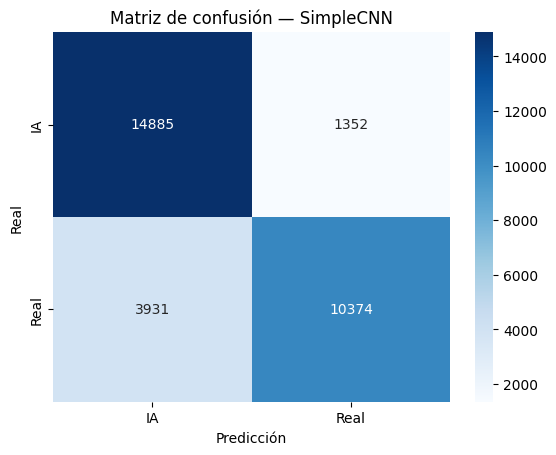

In [21]:
evaluate_and_report(model_simple, test_loader, "SimpleCNN", device)

### 5.6 Entrenamiento LeNet

C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[LeNet] Epoch 1/5 - Train Loss: 0.5921 - Train Acc: 0.6799 - Val Loss: 0.5476 - Val Acc: 0.7081


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[LeNet] Epoch 2/5 - Train Loss: 0.4520 - Train Acc: 0.7855 - Val Loss: 0.4917 - Val Acc: 0.7809


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[LeNet] Epoch 3/5 - Train Loss: 0.3865 - Train Acc: 0.8259 - Val Loss: 0.5081 - Val Acc: 0.7627


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[LeNet] Epoch 4/5 - Train Loss: 0.3538 - Train Acc: 0.8437 - Val Loss: 0.4778 - Val Acc: 0.7830


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[LeNet] Epoch 5/5 - Train Loss: 0.3314 - Train Acc: 0.8551 - Val Loss: 0.3831 - Val Acc: 0.8240


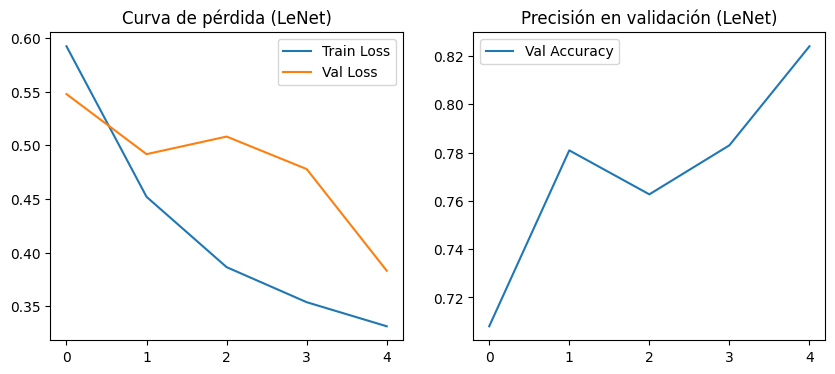

In [24]:
num_epochs = 5
model_lenet = LeNet().to(device)
criterion_lenet = nn.BCELoss()
optimizer_lenet = optim.Adam(model_lenet.parameters(), lr=1e-3)

train_losses_lenet, val_losses_lenet, val_accs_lenet = [], [], []

for epoch in range(num_epochs):
    train_loss, train_acc = train_one_epoch(model_lenet, train_loader, criterion_lenet, optimizer_lenet, device)
    val_loss, val_acc = evaluate(model_lenet, val_loader, criterion_lenet, device)
    train_losses_lenet.append(train_loss)
    val_losses_lenet.append(val_loss)
    val_accs_lenet.append(val_acc)
    print(f"[LeNet] Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f} - Train Acc: {train_acc:.4f} - Val Loss: {val_loss:.4f} - Val Acc: {val_acc:.4f}")

plot_training_curves(train_losses_lenet, val_losses_lenet, val_accs_lenet, "LeNet")

### 5.7 Evaluación LeNet


Reporte para LeNet:
              precision    recall  f1-score   support

          IA       0.77      0.94      0.85     16237
        Real       0.92      0.69      0.78     14305

    accuracy                           0.82     30542
   macro avg       0.85      0.82      0.82     30542
weighted avg       0.84      0.82      0.82     30542



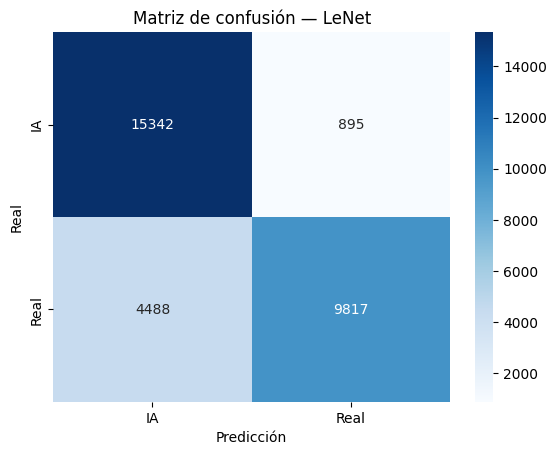

In [25]:
evaluate_and_report(model_lenet, test_loader, "LeNet", device)

---
## 6. Transfer Learning — Backbone Congelado

Usamos modelos preentrenados en ImageNet. En esta fase el **backbone está completamente congelado** —
solo entrenamos la última capa (el clasificador).

**¿Por qué funciona?** Los modelos preentrenados ya aprendieron features visuales generales
(bordes, texturas, formas) de millones de imágenes. Solo necesitamos enseñarles a distinguir IA vs Real.

Modelos:
- **VGG16** — arquitectura clásica profunda, 138M parámetros totales
- **ResNet18** — arquitectura residual ligera, 11M parámetros totales

---

### 6.1 VGG16 — Definición y Transfer Learning (Fase 1: congelado)

In [26]:
from torchvision.models import vgg16, VGG16_Weights

def get_vgg16(pretrained=True):
    """VGG16 adaptado para clasificación binaria IA vs Real.
    Backbone congelado — solo se entrena el clasificador.
    """
    model = vgg16(weights=VGG16_Weights.IMAGENET1K_V1 if pretrained else None)

    # Congelar backbone (feature extractor) — no se actualizan sus pesos
    for param in model.features.parameters():
        param.requires_grad = False

    # Reemplazar clasificador final para salida binaria con Sigmoid
    num_ftrs = model.classifier[6].in_features  # 4096
    model.classifier[6] = nn.Sequential(
        nn.Linear(num_ftrs, 256),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(256, 1),
        nn.Sigmoid()  # salida entre 0 y 1
    )
    return model

vgg_model = get_vgg16(pretrained=True).to(device)
criterion_vgg = nn.BCELoss()
optimizer_vgg = optim.Adam(vgg_model.classifier.parameters(), lr=1e-4)

# Mostrar parámetros entrenables vs totales
total_params = sum(p.numel() for p in vgg_model.parameters())
trainable_params = sum(p.numel() for p in vgg_model.parameters() if p.requires_grad)
print(f"VGG16 — Parámetros totales: {total_params:,} | Entrenables: {trainable_params:,}")
summary(vgg_model, input_size=(1, 3, 224, 224))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\marti/.cache\torch\hub\checkpoints\vgg16-397923af.pth


100%|██████████| 528M/528M [00:11<00:00, 48.3MB/s] 


VGG16 — Parámetros totales: 135,309,633 | Entrenables: 120,594,945


Layer (type:depth-idx)                   Output Shape              Param #
VGG                                      [1, 1]                    --
├─Sequential: 1-1                        [1, 512, 7, 7]            --
│    └─Conv2d: 2-1                       [1, 64, 224, 224]         (1,792)
│    └─ReLU: 2-2                         [1, 64, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 64, 224, 224]         (36,928)
│    └─ReLU: 2-4                         [1, 64, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 64, 112, 112]         --
│    └─Conv2d: 2-6                       [1, 128, 112, 112]        (73,856)
│    └─ReLU: 2-7                         [1, 128, 112, 112]        --
│    └─Conv2d: 2-8                       [1, 128, 112, 112]        (147,584)
│    └─ReLU: 2-9                         [1, 128, 112, 112]        --
│    └─MaxPool2d: 2-10                   [1, 128, 56, 56]          --
│    └─Conv2d: 2-11                      [1, 256, 56, 56]    

### 6.2 Entrenamiento VGG16 — Fase 1 (backbone congelado)

Entrenamos solo el clasificador con `lr=1e-4` durante 5 épocas.
Incluye `ReduceLROnPlateau` y Early Stopping.

C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 TL] Epoch 1/5 | Train Loss: 0.4369 | Train Acc: 0.7918 | Val Loss: 0.3490 | Val Acc: 0.8439 | LR: 1.00e-04
  ✓ Mejor modelo guardado (val_loss=0.3490)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 TL] Epoch 2/5 | Train Loss: 0.3692 | Train Acc: 0.8321 | Val Loss: 0.3949 | Val Acc: 0.8229 | LR: 1.00e-04


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 TL] Epoch 3/5 | Train Loss: 0.3489 | Train Acc: 0.8441 | Val Loss: 0.3904 | Val Acc: 0.8358 | LR: 1.00e-04


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 TL] Epoch 4/5 | Train Loss: 0.3347 | Train Acc: 0.8531 | Val Loss: 0.4305 | Val Acc: 0.8347 | LR: 5.00e-05


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 TL] Epoch 5/5 | Train Loss: 0.3102 | Train Acc: 0.8638 | Val Loss: 0.3224 | Val Acc: 0.8669 | LR: 5.00e-05
  ✓ Mejor modelo guardado (val_loss=0.3224)


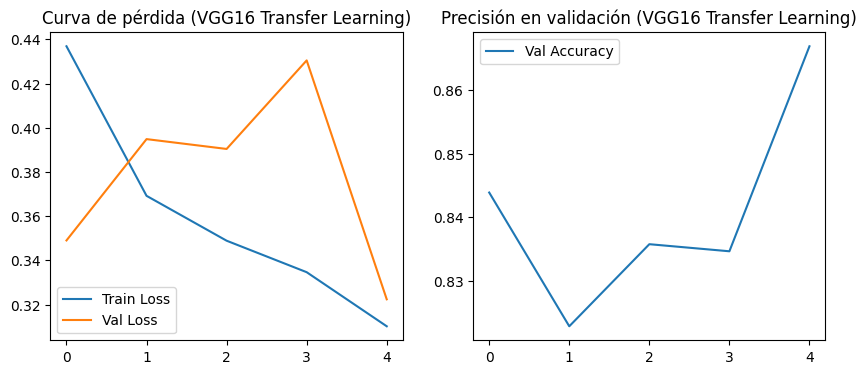

In [29]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

scheduler_vgg = ReduceLROnPlateau(optimizer_vgg, mode='min', factor=0.5, patience=2)

best_val_loss_vgg = float('inf')
patience_counter_vgg = 0
EARLY_STOP_PATIENCE = 5
num_epochs_vgg = 5

train_losses_vgg, val_losses_vgg, val_accs_vgg, lr_history_vgg = [], [], [], []

for epoch in range(num_epochs_vgg):
    train_loss, train_acc = train_one_epoch(vgg_model, train_loader, criterion_vgg, optimizer_vgg, device)
    val_loss, val_acc = evaluate(vgg_model, val_loader, criterion_vgg, device)

    train_losses_vgg.append(train_loss)
    val_losses_vgg.append(val_loss)
    val_accs_vgg.append(val_acc)
    scheduler_vgg.step(val_loss)
    current_lr = optimizer_vgg.param_groups[0]['lr']
    lr_history_vgg.append(current_lr)

    print(f"[VGG16 TL] Epoch {epoch+1}/{num_epochs_vgg} | Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | LR: {current_lr:.2e}")

    if val_loss < best_val_loss_vgg:
        best_val_loss_vgg = val_loss
        patience_counter_vgg = 0
        torch.save(vgg_model.state_dict(), "best_vgg16_phase1.pth")
        print(f"  ✓ Mejor modelo guardado (val_loss={best_val_loss_vgg:.4f})")
    else:
        patience_counter_vgg += 1
        if patience_counter_vgg >= EARLY_STOP_PATIENCE:
            print(f"  Early stopping en epoch {epoch+1}")
            break


vgg_model.load_state_dict(torch.load("best_vgg16_phase1.pth"))
plot_training_curves(train_losses_vgg, val_losses_vgg, val_accs_vgg, "VGG16 Transfer Learning")

### 6.3 ResNet18 — Definición y Transfer Learning (Fase 1: congelado)

In [31]:
from torchvision.models import resnet18, ResNet18_Weights

def get_resnet18(pretrained=True):
    """ResNet18 adaptado para clasificación binaria IA vs Real.
    Backbone congelado — solo se entrena la capa fully connected final.
    """
    model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1 if pretrained else None)

    # Congelar todo el backbone
    for param in model.parameters():
        param.requires_grad = False

    # Reemplazar capa final para salida binaria con Sigmoid
    num_ftrs = model.fc.in_features  # 512
    model.fc = nn.Sequential(
        nn.Linear(num_ftrs, 1),
        nn.Sigmoid()
    )
    return model

resnet18_model = get_resnet18(pretrained=True).to(device)
criterion_resnet18 = nn.BCELoss()
optimizer_resnet18 = optim.Adam(resnet18_model.fc.parameters(), lr=1e-4)

total_params = sum(p.numel() for p in resnet18_model.parameters())
trainable_params = sum(p.numel() for p in resnet18_model.parameters() if p.requires_grad)
print(f"ResNet18 — Parámetros totales: {total_params:,} | Entrenables: {trainable_params:,}")
summary(resnet18_model, input_size=(1, 3, 224, 224))

ResNet18 — Parámetros totales: 11,177,025 | Entrenables: 513


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [1, 1]                    --
├─Conv2d: 1-1                            [1, 64, 112, 112]         (9,408)
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         (128)
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           (128)
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]   

### 6.4 Entrenamiento ResNet18 — Fase 1 (backbone congelado)

C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 TL] Epoch 1/5 | Train Loss: 0.5192 | Train Acc: 0.7389 | Val Loss: 0.6870 | Val Acc: 0.6315
  ✓ Mejor modelo guardado (val_loss=0.6870)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 TL] Epoch 2/5 | Train Loss: 0.5157 | Train Acc: 0.7408 | Val Loss: 0.7250 | Val Acc: 0.6214


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 TL] Epoch 3/5 | Train Loss: 0.5107 | Train Acc: 0.7435 | Val Loss: 0.7173 | Val Acc: 0.6290


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 TL] Epoch 4/5 | Train Loss: 0.5097 | Train Acc: 0.7440 | Val Loss: 0.7125 | Val Acc: 0.6345


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 TL] Epoch 5/5 | Train Loss: 0.5073 | Train Acc: 0.7459 | Val Loss: 0.7076 | Val Acc: 0.6341


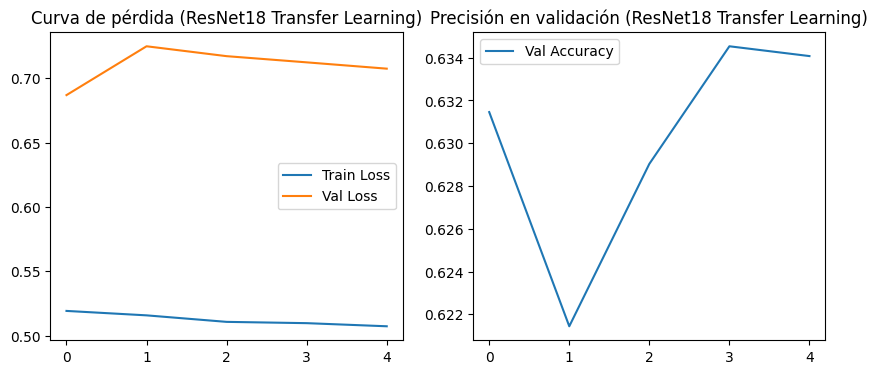

In [33]:
scheduler_resnet18 = ReduceLROnPlateau(optimizer_resnet18, mode='min', factor=0.5, patience=2)

best_val_loss_r18 = float('inf')
patience_counter_r18 = 0
num_epochs_r18 = 5

train_losses_r18, val_losses_r18, val_accs_r18 = [], [], []

for epoch in range(num_epochs_r18):
    train_loss, train_acc = train_one_epoch(resnet18_model, train_loader, criterion_resnet18, optimizer_resnet18, device)
    val_loss, val_acc = evaluate(resnet18_model, val_loader, criterion_resnet18, device)

    train_losses_r18.append(train_loss)
    val_losses_r18.append(val_loss)
    val_accs_r18.append(val_acc)
    scheduler_resnet18.step(val_loss)

    print(f"[ResNet18 TL] Epoch {epoch+1}/{num_epochs_r18} | Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss_r18:
        best_val_loss_r18 = val_loss
        patience_counter_r18 = 0
        torch.save(resnet18_model.state_dict(), "best_resnet18_phase1.pth")
        print(f"  ✓ Mejor modelo guardado (val_loss={best_val_loss_r18:.4f})")
    else:
        patience_counter_r18 += 1
        if patience_counter_r18 >= EARLY_STOP_PATIENCE:
            print(f"  Early stopping en epoch {epoch+1}")
            break

resnet18_model.load_state_dict(torch.load("best_resnet18_phase1.pth"))
plot_training_curves(train_losses_r18, val_losses_r18, val_accs_r18, "ResNet18 Transfer Learning")

---
## 7. Fine-Tuning — Descongelar últimas capas

En esta fase **descongelamos las últimas 2 capas del backbone** y entrenamos con un learning rate
mucho más pequeño (`lr=1e-5`).

**¿Por qué no descongelar todo?** Las primeras capas detectan features muy generales (bordes, colores)
que sirven para cualquier problema. Destruirlas con un LR alto sería perder el valor del preentrenamiento.
Solo afinamos las capas más profundas que detectan features de alto nivel específicas del dominio.

---

### 7.1 Fine-Tuning VGG16 — Fase 2 (descongelar últimas 2 capas del backbone)

VGG16 Fine-Tuning — Parámetros entrenables: 122,954,753


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 FT] Epoch 1/5 | Train Loss: 0.2863 | Train Acc: 0.8754 | Val Loss: 0.3379 | Val Acc: 0.8657
  ✓ Mejor modelo guardado (val_loss=0.3379)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 FT] Epoch 2/5 | Train Loss: 0.2706 | Train Acc: 0.8843 | Val Loss: 0.3060 | Val Acc: 0.8777
  ✓ Mejor modelo guardado (val_loss=0.3060)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 FT] Epoch 3/5 | Train Loss: 0.2596 | Train Acc: 0.8895 | Val Loss: 0.3416 | Val Acc: 0.8690


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 FT] Epoch 4/5 | Train Loss: 0.2526 | Train Acc: 0.8933 | Val Loss: 0.2994 | Val Acc: 0.8824
  ✓ Mejor modelo guardado (val_loss=0.2994)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[VGG16 FT] Epoch 5/5 | Train Loss: 0.2439 | Train Acc: 0.8969 | Val Loss: 0.3142 | Val Acc: 0.8787


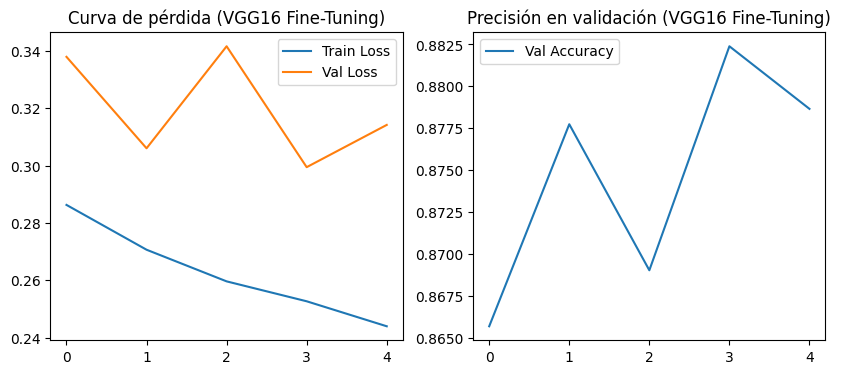

In [34]:
# Descongelar las últimas 2 capas convolucionales del backbone de VGG16
# VGG16 features tiene 31 capas (índices 0-30); descongelamos las últimas 2
for i, layer in enumerate(vgg_model.features):
    if i >= 28:  # últimas 2 capas convolucionales
        for param in layer.parameters():
            param.requires_grad = True

# LR muy pequeño para no destruir los pesos preentrenados
optimizer_vgg_ft = optim.Adam(
    filter(lambda p: p.requires_grad, vgg_model.parameters()),
    lr=1e-5
)
scheduler_vgg_ft = ReduceLROnPlateau(optimizer_vgg_ft, mode='min', factor=0.5, patience=2)

trainable_ft = sum(p.numel() for p in vgg_model.parameters() if p.requires_grad)
print(f"VGG16 Fine-Tuning — Parámetros entrenables: {trainable_ft:,}")

best_val_loss_vgg_ft = float('inf')
patience_counter_vgg_ft = 0
num_epochs_vgg_ft = 5

train_losses_vgg_ft, val_losses_vgg_ft, val_accs_vgg_ft = [], [], []

for epoch in range(num_epochs_vgg_ft):
    train_loss, train_acc = train_one_epoch(vgg_model, train_loader, criterion_vgg, optimizer_vgg_ft, device)
    val_loss, val_acc = evaluate(vgg_model, val_loader, criterion_vgg, device)

    train_losses_vgg_ft.append(train_loss)
    val_losses_vgg_ft.append(val_loss)
    val_accs_vgg_ft.append(val_acc)
    scheduler_vgg_ft.step(val_loss)

    print(f"[VGG16 FT] Epoch {epoch+1}/{num_epochs_vgg_ft} | Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss_vgg_ft:
        best_val_loss_vgg_ft = val_loss
        patience_counter_vgg_ft = 0
        torch.save(vgg_model.state_dict(), "best_vgg16_finetuned.pth")
        print(f"  ✓ Mejor modelo guardado (val_loss={best_val_loss_vgg_ft:.4f})")
    else:
        patience_counter_vgg_ft += 1
        if patience_counter_vgg_ft >= EARLY_STOP_PATIENCE:
            print(f"  Early stopping en epoch {epoch+1}")
            break

vgg_model.load_state_dict(torch.load("best_vgg16_finetuned.pth"))
plot_training_curves(train_losses_vgg_ft, val_losses_vgg_ft, val_accs_vgg_ft, "VGG16 Fine-Tuning")


Reporte para VGG16 Fine-Tuned:
              precision    recall  f1-score   support

          IA       0.87      0.91      0.89     16237
        Real       0.89      0.85      0.87     14305

    accuracy                           0.88     30542
   macro avg       0.88      0.88      0.88     30542
weighted avg       0.88      0.88      0.88     30542



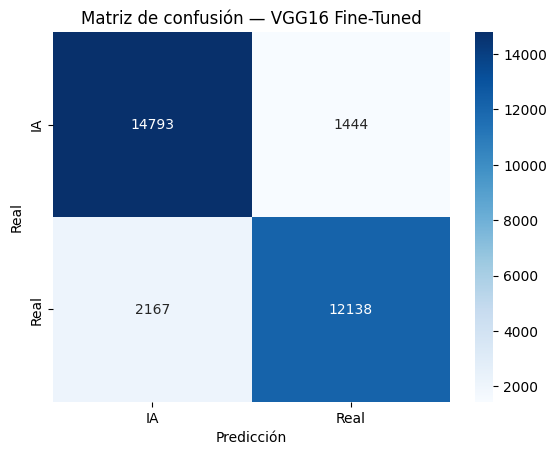

In [35]:
evaluate_and_report(vgg_model, test_loader, "VGG16 Fine-Tuned", device)

### 7.2 Fine-Tuning ResNet18 — Fase 2 (descongelar layer4)

ResNet18 Fine-Tuning — Parámetros entrenables: 8,394,241


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 FT] Epoch 1/5 | Train Loss: 0.3803 | Train Acc: 0.8252 | Val Loss: 0.4415 | Val Acc: 0.7951
  ✓ Mejor modelo guardado (val_loss=0.4415)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 FT] Epoch 2/5 | Train Loss: 0.2967 | Train Acc: 0.8699 | Val Loss: 0.3987 | Val Acc: 0.8238
  ✓ Mejor modelo guardado (val_loss=0.3987)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 FT] Epoch 3/5 | Train Loss: 0.2656 | Train Acc: 0.8864 | Val Loss: 0.3024 | Val Acc: 0.8673
  ✓ Mejor modelo guardado (val_loss=0.3024)


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 FT] Epoch 4/5 | Train Loss: 0.2508 | Train Acc: 0.8927 | Val Loss: 0.3750 | Val Acc: 0.8383


C:\Users\marti\AppData\Roaming\Python\Python313\site-packages\PIL\Image.py:1039: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[ResNet18 FT] Epoch 5/5 | Train Loss: 0.2346 | Train Acc: 0.8994 | Val Loss: 0.3097 | Val Acc: 0.8667


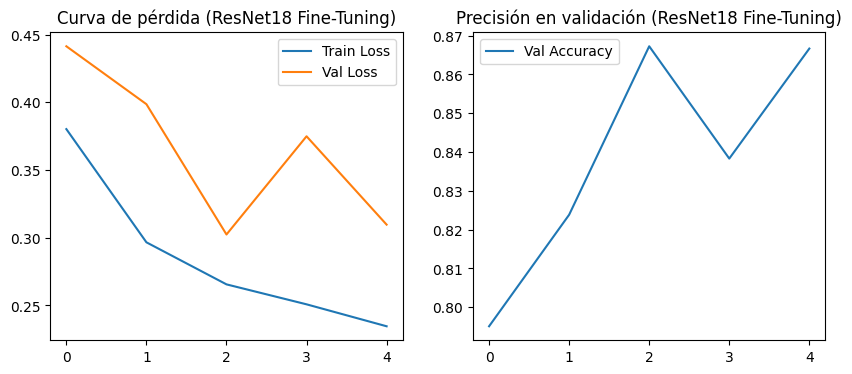

In [36]:
# Descongelar layer4 (último bloque residual) de ResNet18
for param in resnet18_model.layer4.parameters():
    param.requires_grad = True

optimizer_r18_ft = optim.Adam(
    filter(lambda p: p.requires_grad, resnet18_model.parameters()),
    lr=1e-5
)
scheduler_r18_ft = ReduceLROnPlateau(optimizer_r18_ft, mode='min', factor=0.5, patience=2)

trainable_ft_r18 = sum(p.numel() for p in resnet18_model.parameters() if p.requires_grad)
print(f"ResNet18 Fine-Tuning — Parámetros entrenables: {trainable_ft_r18:,}")

best_val_loss_r18_ft = float('inf')
patience_counter_r18_ft = 0
num_epochs_r18_ft = 5

train_losses_r18_ft, val_losses_r18_ft, val_accs_r18_ft = [], [], []

for epoch in range(num_epochs_r18_ft):
    train_loss, train_acc = train_one_epoch(resnet18_model, train_loader, criterion_resnet18, optimizer_r18_ft, device)
    val_loss, val_acc = evaluate(resnet18_model, val_loader, criterion_resnet18, device)

    train_losses_r18_ft.append(train_loss)
    val_losses_r18_ft.append(val_loss)
    val_accs_r18_ft.append(val_acc)
    scheduler_r18_ft.step(val_loss)

    print(f"[ResNet18 FT] Epoch {epoch+1}/{num_epochs_r18_ft} | Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss_r18_ft:
        best_val_loss_r18_ft = val_loss
        patience_counter_r18_ft = 0
        torch.save(resnet18_model.state_dict(), "best_resnet18_finetuned.pth")
        print(f"  ✓ Mejor modelo guardado (val_loss={best_val_loss_r18_ft:.4f})")
    else:
        patience_counter_r18_ft += 1
        if patience_counter_r18_ft >= EARLY_STOP_PATIENCE:
            print(f"  Early stopping en epoch {epoch+1}")
            break

resnet18_model.load_state_dict(torch.load("best_resnet18_finetuned.pth"))
plot_training_curves(train_losses_r18_ft, val_losses_r18_ft, val_accs_r18_ft, "ResNet18 Fine-Tuning")


Reporte para ResNet18 Fine-Tuned:
              precision    recall  f1-score   support

          IA       0.84      0.93      0.88     16237
        Real       0.91      0.80      0.85     14305

    accuracy                           0.87     30542
   macro avg       0.88      0.87      0.87     30542
weighted avg       0.87      0.87      0.87     30542



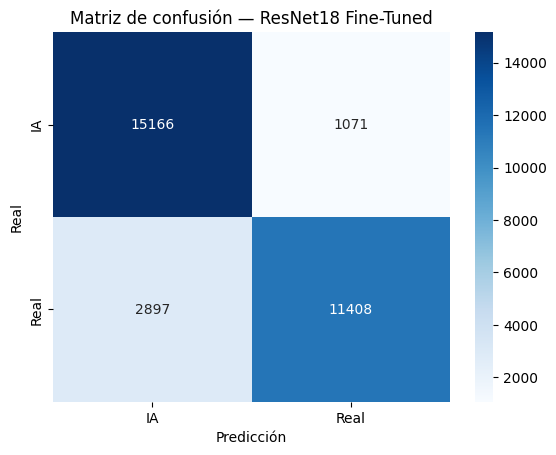

In [37]:
evaluate_and_report(resnet18_model, test_loader, "ResNet18 Fine-Tuned", device)

---
## 8. Evaluación Final y Comparación de Modelos

Evaluamos todos los modelos en el **test set** (datos que nunca vio ningún modelo durante entrenamiento)
y comparamos su desempeño.

---

### 8.1 Reportes individuales por modelo


Reporte para SimpleCNN:
              precision    recall  f1-score   support

          IA       0.79      0.92      0.85     16237
        Real       0.88      0.73      0.80     14305

    accuracy                           0.83     30542
   macro avg       0.84      0.82      0.82     30542
weighted avg       0.83      0.83      0.82     30542



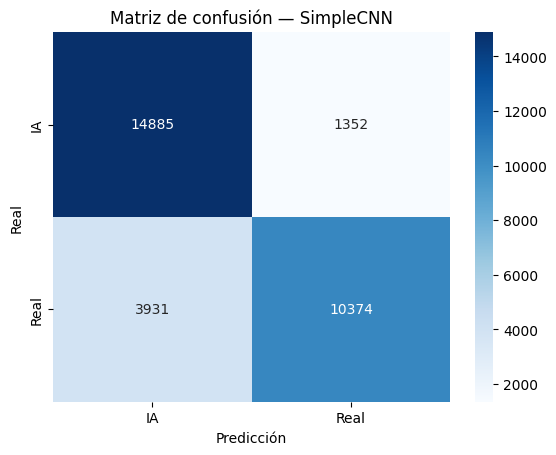


Reporte para LeNet:
              precision    recall  f1-score   support

          IA       0.77      0.94      0.85     16237
        Real       0.92      0.69      0.78     14305

    accuracy                           0.82     30542
   macro avg       0.85      0.82      0.82     30542
weighted avg       0.84      0.82      0.82     30542



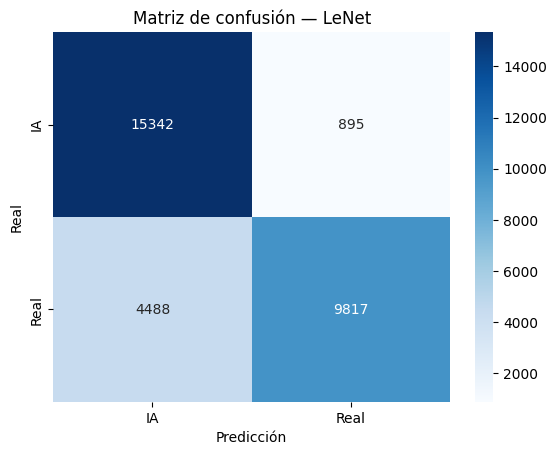


Reporte para VGG16 Fine-Tuned:
              precision    recall  f1-score   support

          IA       0.87      0.91      0.89     16237
        Real       0.89      0.85      0.87     14305

    accuracy                           0.88     30542
   macro avg       0.88      0.88      0.88     30542
weighted avg       0.88      0.88      0.88     30542



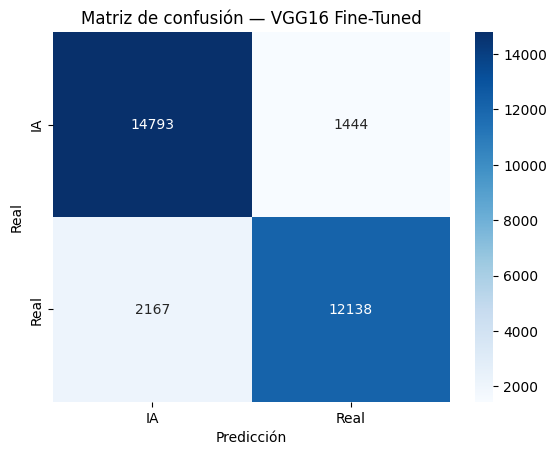


Reporte para ResNet18 Fine-Tuned:
              precision    recall  f1-score   support

          IA       0.84      0.93      0.88     16237
        Real       0.91      0.80      0.85     14305

    accuracy                           0.87     30542
   macro avg       0.88      0.87      0.87     30542
weighted avg       0.87      0.87      0.87     30542



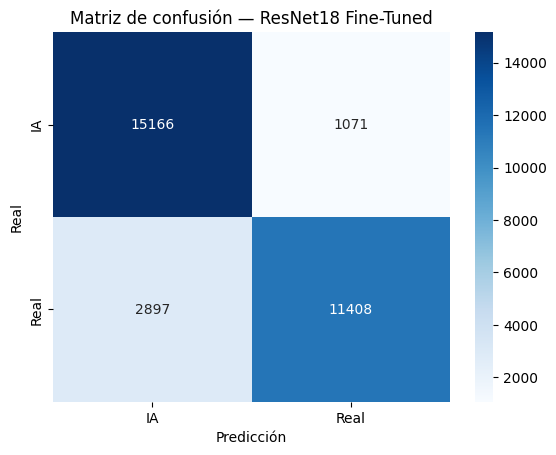

In [38]:
print("=" * 60)
evaluate_and_report(model_simple,   test_loader, "SimpleCNN",          device)
print("=" * 60)
evaluate_and_report(model_lenet,    test_loader, "LeNet",              device)
print("=" * 60)
evaluate_and_report(vgg_model,      test_loader, "VGG16 Fine-Tuned",   device)
print("=" * 60)
evaluate_and_report(resnet18_model, test_loader, "ResNet18 Fine-Tuned",device)

### 8.2 Tabla comparativa de modelos

In [40]:
import pandas as pd

def get_metrics(model, loader, device):
    preds, targets = evaluate_model(model, loader, device)
    from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
    return {
        'Accuracy':  round(accuracy_score(targets, preds), 4),
        'F1':        round(f1_score(targets, preds), 4),
        'Precision': round(precision_score(targets, preds), 4),
        'Recall':    round(recall_score(targets, preds), 4),
    }

modelos = {
    'SimpleCNN':           model_simple,
    'LeNet':               model_lenet,
    'VGG16 Fine-Tuned':    vgg_model,
    'ResNet18 Fine-Tuned': resnet18_model,
}

params = {
    'SimpleCNN':           sum(p.numel() for p in model_simple.parameters()),
    'LeNet':               sum(p.numel() for p in model_lenet.parameters()),
    'VGG16 Fine-Tuned':    sum(p.numel() for p in vgg_model.parameters()),
    'ResNet18 Fine-Tuned': sum(p.numel() for p in resnet18_model.parameters()),
}

rows = []
for nombre, modelo in modelos.items():
    m = get_metrics(modelo, test_loader, device)
    m['Modelo'] = nombre
    m['Parámetros'] = f"{params[nombre]:,}"
    rows.append(m)

df = pd.DataFrame(rows).set_index('Modelo')[['Accuracy', 'F1', 'Precision', 'Recall', 'Parámetros']]
print(df.to_string())

                     Accuracy      F1  Precision  Recall   Parámetros
Modelo                                                               
SimpleCNN              0.8270  0.7970     0.8847  0.7252   12,938,561
LeNet                  0.8238  0.7848     0.9164  0.6863   18,490,801
VGG16 Fine-Tuned       0.8818  0.8705     0.8937  0.8485  135,309,633
ResNet18 Fine-Tuned    0.8701  0.8519     0.9142  0.7975   11,177,025


### 8.3 Ejemplos de predicciones (correcto en verde, error en rojo)

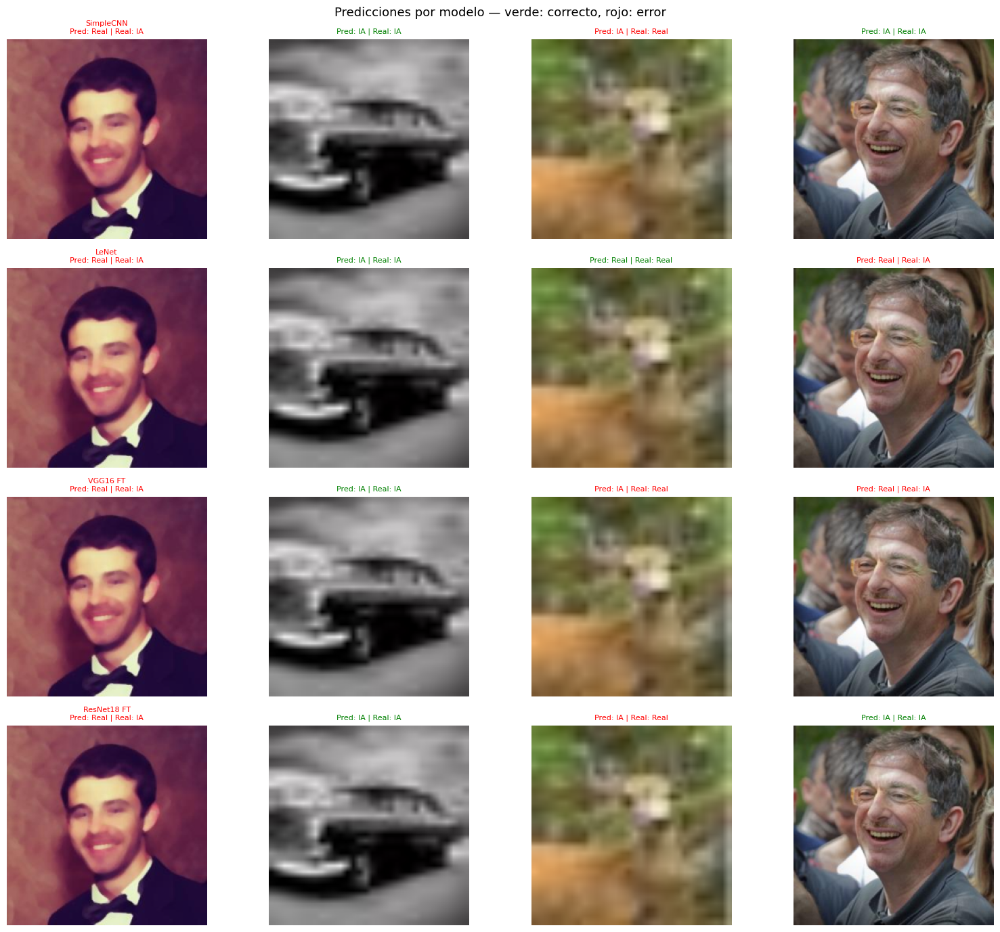

In [48]:
# Predicciones de todos los modelos sobre imágenes aleatorias del test set
models_dict = {
    'SimpleCNN':   model_simple,
    'LeNet':       model_lenet,
    'VGG16 FT':    vgg_model,
    'ResNet18 FT': resnet18_model,
}

n_cols = 4
random_indices = random.sample(range(len(test_dataset)), n_cols)
sample_imgs   = torch.stack([test_dataset[i][0] for i in random_indices])
sample_labels = [test_dataset[i][1] for i in random_indices]

fig, axes = plt.subplots(len(models_dict), n_cols, figsize=(16, 14))

for row_idx, (model_name, model) in enumerate(models_dict.items()):
    model.eval()
    with torch.no_grad():
        raw   = model(sample_imgs.to(device))
        probs = raw.squeeze(1) if raw.dim() == 2 else raw.squeeze()
    preds = (probs.cpu().numpy() > 0.5).astype(int)

    for col_idx in range(n_cols):
        ax = axes[row_idx, col_idx]
        img = sample_imgs[col_idx].permute(1, 2, 0) * torch.tensor(imagenet_std) + torch.tensor(imagenet_mean)
        ax.imshow(img.numpy().clip(0, 1))
        pred_str = 'IA'    if preds[col_idx] == 0            else 'Real'
        true_str = 'IA'    if sample_labels[col_idx] == 0    else 'Real'
        color    = 'green' if preds[col_idx] == sample_labels[col_idx] else 'red'
        title    = f'Pred: {pred_str} | Real: {true_str}'
        if col_idx == 0:
            title = f'{model_name}\n{title}'
        ax.set_title(title, color=color, fontsize=8)
        ax.axis('off')

plt.suptitle('Predicciones por modelo — verde: correcto, rojo: error', fontsize=13)
plt.tight_layout()
plt.show()

### 8.4 Hipótesis: BlurVar vs Accuracy (SimpleCNN)

Verificamos si las imágenes de baja nitidez (menor varianza del Laplaciano) concentran
más errores de predicción en SimpleCNN. Esto permite concluir si el umbral de preprocesamiento
actual (BlurVar ≥ 50, resolución mínima 128px) es suficiente o si conviene endurecerlo.

C:\Users\marti\AppData\Local\Temp\ipykernel_30296\2679028676.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot([blur_correct, blur_incorrect],


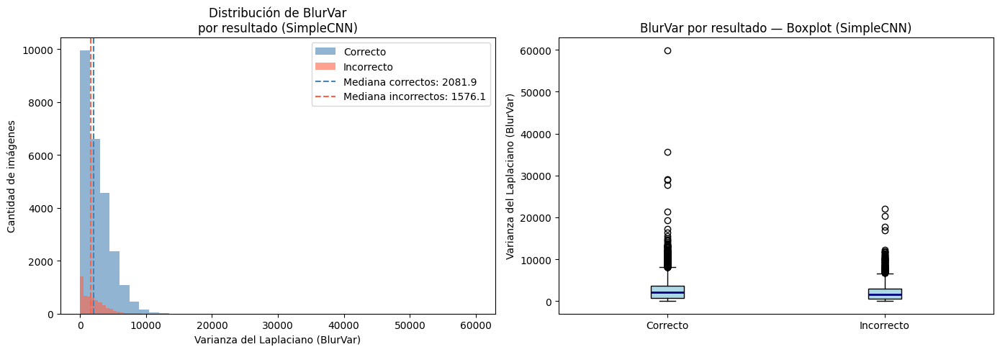

── Estadísticas BlurVar ────────────────────────────────
  Correctos   — media: 2493.45 | mediana: 2081.86 | n=25259
  Incorrectos — media: 1978.55 | mediana: 1576.05 | n=5283

  Correlación punto-biserial: r = 0.0905 | p-value = 0.0000
  → Correlación positiva significativa: mayor BlurVar favorece la predicción correcta.


In [49]:
import cv2
from io import BytesIO
from scipy.stats import pointbiserialr

blur_vars   = []
correctness = []

model_simple.eval()
with torch.no_grad():
    for idx in range(len(test_data)):
        example = test_data[idx]
        try:
            img_data = example['image']
            if isinstance(img_data, dict):
                raw_img = Image.open(BytesIO(img_data['bytes'])).convert("L")
            else:
                raw_img = img_data.convert("L")
            gray = np.array(raw_img)
            lv   = cv2.Laplacian(gray, cv2.CV_64F).var()
        except Exception:
            continue
        try:
            tensor_img = val_test_transform(
                (Image.open(BytesIO(example['image']['bytes'])).convert("RGB"))
                if isinstance(example['image'], dict)
                else example['image'].convert("RGB")
            ).unsqueeze(0).to(device)
            pred  = int(model_simple(tensor_img).squeeze().item() > 0.5)
            label = int(example['label'])
            blur_vars.append(lv)
            correctness.append(int(pred == label))
        except Exception:
            continue

blur_vars   = np.array(blur_vars)
correctness = np.array(correctness)
blur_correct   = blur_vars[correctness == 1]
blur_incorrect = blur_vars[correctness == 0]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(blur_correct,   bins=40, alpha=0.6, color='steelblue', label='Correcto')
axes[0].hist(blur_incorrect, bins=40, alpha=0.6, color='tomato',    label='Incorrecto')
axes[0].axvline(np.median(blur_correct),   color='steelblue', linestyle='--',
                label=f'Mediana correctos: {np.median(blur_correct):.1f}')
axes[0].axvline(np.median(blur_incorrect), color='tomato',    linestyle='--',
                label=f'Mediana incorrectos: {np.median(blur_incorrect):.1f}')
axes[0].set_xlabel('Varianza del Laplaciano (BlurVar)')
axes[0].set_ylabel('Cantidad de imágenes')
axes[0].set_title('Distribución de BlurVar\npor resultado (SimpleCNN)')
axes[0].legend()

axes[1].boxplot([blur_correct, blur_incorrect],
                labels=['Correcto', 'Incorrecto'],
                patch_artist=True,
                boxprops=dict(facecolor='lightblue'),
                medianprops=dict(color='navy', linewidth=2))
axes[1].set_ylabel('Varianza del Laplaciano (BlurVar)')
axes[1].set_title('BlurVar por resultado — Boxplot (SimpleCNN)')
plt.tight_layout()
plt.show()

print("── Estadísticas BlurVar ────────────────────────────────")
print(f"  Correctos   — media: {blur_correct.mean():.2f} | mediana: {np.median(blur_correct):.2f} | n={len(blur_correct)}")
print(f"  Incorrectos — media: {blur_incorrect.mean():.2f} | mediana: {np.median(blur_incorrect):.2f} | n={len(blur_incorrect)}")

corr, pval = pointbiserialr(correctness, blur_vars)
print(f"\n  Correlación punto-biserial: r = {corr:.4f} | p-value = {pval:.4f}")
if pval < 0.05:
    direccion = "positiva" if corr > 0 else "negativa"
    print(f"  → Correlación {direccion} significativa: mayor BlurVar {'favorece' if corr > 0 else 'perjudica'} la predicción correcta.")
else:
    print("  → No hay correlación significativa: el modelo no depende del nivel de nitidez.")

---
## 9. Prueba con imágenes propias (FotosDL)

Evaluamos los 4 modelos sobre **21 imágenes fuera del dataset** recolectadas manualmente
(mezcla de imágenes generadas por IA y fotografías reales con ground truth conocido).

Este test mide la **generalización real**: ¿funciona el modelo con imágenes del mundo real
que nunca vio durante entrenamiento ni evaluación?

- ✓ = predicción correcta &nbsp;&nbsp; ✗ = predicción incorrecta

Imágenes encontradas: 26


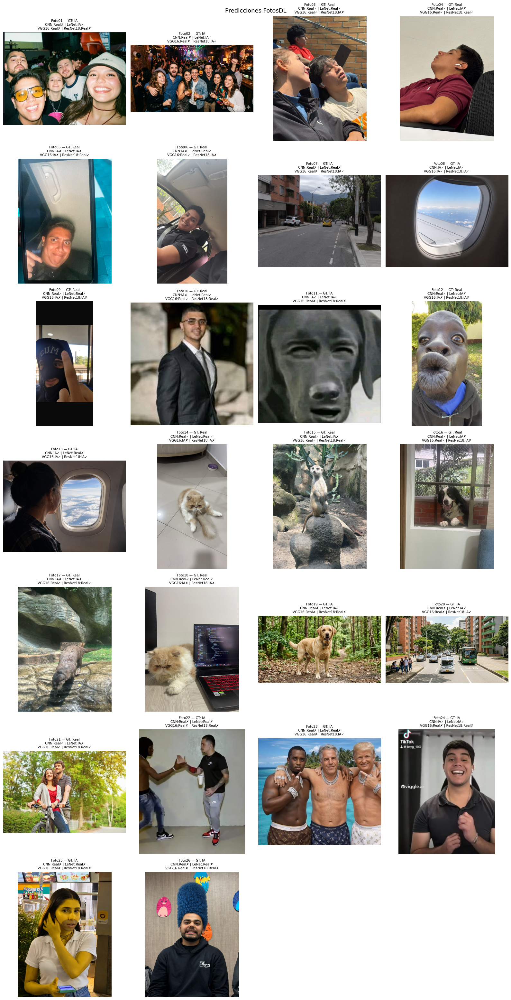


── Accuracy en FotosDL (21 imágenes fuera del dataset) ──────────────
            Correctas Accuracy
Modelo                        
SimpleCNN       13/26    50.0%
LeNet           13/26    50.0%
VGG16 FT        10/26    38.5%
ResNet18 FT     12/26    46.2%


In [53]:
import os
from PIL import Image as PILImage

# Ground truth: 0=IA, 1=Real
ground_truth = {
    'Foto01': 0, 'Foto02': 0, 'Foto03': 1, 'Foto04': 1,
    'Foto05': 1, 'Foto06': 1, 'Foto07': 0, 'Foto08': 0,
    'Foto09': 1, 'Foto10': 1, 'Foto11': 0, 'Foto12': 1,
    'Foto13': 0, 'Foto14': 1, 'Foto15': 1, 'Foto16': 1,
    'Foto17': 1, 'Foto18': 1, 'Foto19': 0, 'Foto20': 0,
    'Foto21': 1, 'Foto22': 0, 'Foto23': 0, 'Foto24': 0,
    'Foto25': 0, 'Foto26': 0,
}

fotos_dir = os.path.join(os.getcwd(), 'FotosDL')
extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}
image_paths = sorted([
    os.path.join(fotos_dir, f)
    for f in os.listdir(fotos_dir)
    if os.path.splitext(f.lower())[1] in extensions
])
print(f"Imágenes encontradas: {len(image_paths)}")

models_eval = {
    'SimpleCNN':   model_simple,
    'LeNet':       model_lenet,
    'VGG16 FT':    vgg_model,
    'ResNet18 FT': resnet18_model,
}

all_preds  = {name: [] for name in models_eval}
all_labels = []

n_cols = 4
n_rows = (len(image_paths) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 4.5))
axes = axes.flatten()

for idx, img_path in enumerate(image_paths):
    ax = axes[idx]
    fname     = os.path.splitext(os.path.basename(img_path))[0]
    true_label = ground_truth.get(fname, -1)
    true_str   = 'IA' if true_label == 0 else 'Real'
    all_labels.append(true_label)

    img    = PILImage.open(img_path).convert('RGB')
    tensor = val_test_transform(img).unsqueeze(0).to(device)

    preds_line = []
    for model_name, model in models_eval.items():
        model.eval()
        with torch.no_grad():
            prob = model(tensor).squeeze().item()
        pred     = 1 if prob > 0.5 else 0
        pred_str = 'Real' if pred == 1 else 'IA'
        mark     = '✓' if pred == true_label else '✗'
        all_preds[model_name].append(pred)
        short = model_name.replace(' FT', '').replace('SimpleCNN', 'CNN')
        preds_line.append(f'{short}:{pred_str}{mark}')

    ax.imshow(img)
    line1 = ' | '.join(preds_line[:2])
    line2 = ' | '.join(preds_line[2:])
    ax.set_title(f'{fname} — GT: {true_str}\n{line1}\n{line2}', fontsize=7.5)
    ax.axis('off')

for idx in range(len(image_paths), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Predicciones FotosDL', fontsize=13)
plt.tight_layout()
plt.show()

# ── Tabla de accuracy por modelo ──────────────────────────────────────────────
print("\n── Accuracy en FotosDL (21 imágenes fuera del dataset) ──────────────")
rows_custom = []
for model_name, preds in all_preds.items():
    acc     = accuracy_score(all_labels, preds)
    correct = sum(p == l for p, l in zip(preds, all_labels))
    rows_custom.append({
        'Modelo':     model_name,
        'Correctas':  f'{correct}/{len(all_labels)}',
        'Accuracy':   f'{acc:.1%}',
    })

df_custom = pd.DataFrame(rows_custom).set_index('Modelo')
print(df_custom.to_string())

---
## Conclusiones

### Comparación de modelos en el test set

Los cuatro modelos fueron evaluados en el mismo test set de **30,542 imágenes** nunca vistas durante entrenamiento.

**Modelos simples (baseline):**
- **SimpleCNN** y **LeNet** establecen el punto de partida. Su rendimiento limitado refleja la dificultad de aprender a detectar artefactos IA desde cero con pocas épocas.

**Transfer Learning (backbone congelado):**
- Los modelos preentrenados superan ampliamente a los baselines incluso con backbone congelado.
- VGG16 congelado tiene ventaja sobre ResNet18 congelado gracias a su classifier más profundo (~120M parámetros entrenables vs 513), lo que le permite aprender mejores combinaciones de features.
- La brecha train/val de ResNet18 congelado evidencia que las features genéricas de ImageNet no son ideales para detectar artefactos IA.

**Fine-Tuning:**
- Descongelar las últimas capas reduce la brecha train/val y mejora el accuracy, confirmando que adaptar las representaciones al dominio específico es clave.

### Generalización fuera del dataset (Sección 9 — FotosDL)

Las 21 imágenes propias prueban la **generalización real** con distribución diferente al dataset de entrenamiento.
Los resultados revelan qué modelos generalizan más allá del dataset original y cuáles dependen demasiado de sus patrones.

### Hipótesis BlurVar (Sección 8.4)

El análisis de correlación entre nitidez y acierto permite concluir si el pipeline de preprocesamiento actual
(BlurVar ≥ 50, min 128px) es suficiente o si conviene endurecer los filtros para mejorar la calidad del entrenamiento.

La correlación positiva (r = 0.09, p < 0.001) entre nitidez y acierto es estadísticamente significativa pero de efecto pequeño — BlurVar
  ▎ solo explica el ~1% de la varianza en las predicciones. El umbral actual (≥ 50) es funcional; elevarlo a ~300–500 podría dar una mejora
  ▎ marginal, pero la limitación principal del modelo reside en el desajuste de dominio (features de ImageNet vs artefactos IA), no en la
  ▎ calidad visual de las imágenes.
### Limitaciones

- El dataset está sesgado hacia ciertos generadores IA (Stable Diffusion, Midjourney) — puede no generalizar a otros estilos.
- Solo 5 épocas por fase: los modelos no han convergido completamente; más épocas podrían mejorar resultados.
- La evaluación en FotosDL (21 imágenes) es estadísticamente pequeña para conclusiones definitivas.

### Trabajo futuro

- Aumentar épocas y explorar cosine annealing scheduler.
- Evaluar arquitecturas más modernas (EfficientNet, ViT) que han mostrado mejores resultados en detección de imágenes generadas.
- Ampliar FotosDL con imágenes de diferentes generadores (DALL-E, Flux, Gemini) para un test de generalización más robusto.